# Playing with matrices
(and if you get the subliminal message about abstractions, we'll be thrilled!)

Julia is a dynamic language.  You don't need type declarations, and can change variable types dynamically and interactively.

For working with simple numbers, arrays, and strings, its syntax is *superficially* similar to Matlab, Python, and other popular languages.

In order to execute the `In` cells, select the cell and press `Shift-Enter`, or press the `Play` button above. To run the entire notebook, navigate to the `Cell` menu and then `Run All`.

# We tell beginners, you don't need types!

In [5]:
bits(x) = bitstring(x)

bits (generic function with 1 method)

In [1]:
typeof(1.0)

Float64

In [9]:
bits(1.0)

"0011111111110000000000000000000000000000000000000000000000000000"

In [2]:
typeof(1)

Int64

In [10]:
bitstring(1)

"0000000000000000000000000000000000000000000000000000000000000001"

In [11]:
S = "Hello Julia Clsas"
typeof(S)

String

In [12]:
#  Exercise fix my spelling in the cell above
S

"Hello Julia Clsas"

# Now forget all that (for now): Julia is not so different from your favorite dynamic language

In [13]:
1 + 1  # shift + enter to run

2

In [14]:
A = rand(5, 5)

5×5 Array{Float64,2}:
 0.542615  0.660152   0.466469  0.773394  0.149922 
 0.374151  0.0635059  0.111603  0.249842  0.380687 
 0.24158   0.0984279  0.889733  0.580475  0.307541 
 0.828671  0.453381   0.474544  0.863596  0.635815 
 0.197451  0.480238   0.877683  0.17559   0.0596221

In [15]:
using LinearAlgebra # A LinearAlgebra standard package contains structured matrices
A = SymTridiagonal(rand(6), rand(5))

6×6 SymTridiagonal{Float64,Array{Float64,1}}:
 0.428648  0.352035    ⋅         ⋅         ⋅         ⋅      
 0.352035  0.0653637  0.927081   ⋅         ⋅         ⋅      
  ⋅        0.927081   0.857283  0.761855   ⋅         ⋅      
  ⋅         ⋅         0.761855  0.294679  0.591358   ⋅      
  ⋅         ⋅          ⋅        0.591358  0.962655  0.490475
  ⋅         ⋅          ⋅         ⋅        0.490475  0.135266

In [16]:
dump(A)

SymTridiagonal{Float64,Array{Float64,1}}
  dv: Array{Float64}((6,)) [0.428648, 0.0653637, 0.857283, 0.294679, 0.962655, 0.135266]
  ev: Array{Float64}((5,)) [0.352035, 0.927081, 0.761855, 0.591358, 0.490475]


In [17]:
b = rand(6)
A \ b

6-element Array{Float64,1}:
 -1.023128537623093  
  2.4522279663490676 
  0.33746886169886176
 -2.844466673450019  
  1.242414725971361  
  1.9497436907811232 

In [18]:
A = fill(2, 5, 5) # Fill a 5x5 array with 2's

5×5 Array{Int64,2}:
 2  2  2  2  2
 2  2  2  2  2
 2  2  2  2  2
 2  2  2  2  2
 2  2  2  2  2

In [19]:
dump(A)

Array{Int64}((5, 5)) [2 2 … 2 2; 2 2 … 2 2; … ; 2 2 … 2 2; 2 2 … 2 2]


# Let's create some addition tables

First let's use a nested for loop to fill in a matrix that's initially zero:

In [20]:
A = zeros(5, 5)

for i in 1:5
    for j in 1:5
        A[i, j] = i+j  # Square brackets for indices.  Also: indices start at 1, not 0.
    end
end

A

5×5 Array{Float64,2}:
 2.0  3.0  4.0  5.0   6.0
 3.0  4.0  5.0  6.0   7.0
 4.0  5.0  6.0  7.0   8.0
 5.0  6.0  7.0  8.0   9.0
 6.0  7.0  8.0  9.0  10.0

We can abbreviate this using a double `for` loop:

In [21]:
for i in 1:5, j in 1:5
   A[i, j] = i+j  # Square brackets for indices.  Also: indices start at 1, not 0.
end

A

5×5 Array{Float64,2}:
 2.0  3.0  4.0  5.0   6.0
 3.0  4.0  5.0  6.0   7.0
 4.0  5.0  6.0  7.0   8.0
 5.0  6.0  7.0  8.0   9.0
 6.0  7.0  8.0  9.0  10.0

The Julia way would be to use a so-called **array comprehension**:

In [22]:
[i+j for i in 1:5, j in 1:5]

5×5 Array{Int64,2}:
 2  3  4  5   6
 3  4  5  6   7
 4  5  6  7   8
 5  6  7  8   9
 6  7  8  9  10

In [24]:
# Equivalently,
[i+j for i ∈ 1:5, j ∈ 1:5]

5×5 Array{Int64,2}:
 2  3  4  5   6
 3  4  5  6   7
 4  5  6  7   8
 5  6  7  8   9
 6  7  8  9  10

In [25]:
α = 4 ## Alpha ALPHA 

4

**Explore**: What does the following do? 

In [26]:
[i for i in (1:7).^2]

7-element Array{Int64,1}:
  1
  4
  9
 16
 25
 36
 49

In [27]:
# What happens when  we remove the dot syntax?
[i for i in (1:7)^2]

MethodError: MethodError: no method matching ^(::UnitRange{Int64}, ::Int64)
Closest candidates are:
  ^(!Matched::Float16, ::Integer) at math.jl:782
  ^(!Matched::Missing, ::Integer) at missing.jl:120
  ^(!Matched::Missing, ::Number) at missing.jl:93
  ...

In [29]:
sin.(rand(5))

5-element Array{Float64,1}:
 0.49975146290822176
 0.7580895765250962 
 0.6707390622003687 
 0.3705079764040662 
 0.4674444463313133 

In [30]:
[i^2 for i in 1:7]

7-element Array{Int64,1}:
  1
  4
  9
 16
 25
 36
 49

**Explore**: What does the following do? 

In [31]:
sort(unique(x^2 + y^2 for x in 1:5, y in 1:5))  # The inner parentheses define a **generator**

15-element Array{Int64,1}:
  2
  5
  8
 10
 13
 17
 18
 20
 25
 26
 29
 32
 34
 41
 50

Suppose we want to see $n \times n$ multiplication tables for $n=1,2,3,4,5$:

In [32]:
for n in 1:5
    display([i*j for i=1:n, j=1:n])
end

1×1 Array{Int64,2}:
 1

2×2 Array{Int64,2}:
 1  2
 2  4

3×3 Array{Int64,2}:
 1  2  3
 2  4  6
 3  6  9

4×4 Array{Int64,2}:
 1  2   3   4
 2  4   6   8
 3  6   9  12
 4  8  12  16

5×5 Array{Int64,2}:
 1   2   3   4   5
 2   4   6   8  10
 3   6   9  12  15
 4   8  12  16  20
 5  10  15  20  25

# `Interact.jl` is a Julia *package* for interacting with data

It's way more fun to **interact** with our data.
We install the `Interact.jl` package as follows; this needs to be executed only once for any given Julia installation:

In [83]:
# using Pkg; Pkg.add("Interact")

Now we load the package with the following `using` command, in each Julia session:

In [33]:
using Interact

HTML{String}("    <script class='js-collapse-script'>\n        var curMatch =\n            window.location.href\n            .match(/(.*?)\\/notebooks\\/.*\\.ipynb/);\n\n        curMatch = curMatch ||\n            window.location.href\n            .match(/(.*?)\\/apps\\/.*\\.ipynb/);\n\n        if ( curMatch ) {\n            \$('head').append('<base href=\"' + curMatch[1] + '/\">');\n        }\n    </script>\n")

HTML{String}("<script class='js-collapse-script' src='/assetserver/79d807cce809f9a1957ea304038c44c3767b79e6-assets/webio/dist/bundle.js'></script>")

HTML{String}("<script class='js-collapse-script' src='/assetserver/79d807cce809f9a1957ea304038c44c3767b79e6-assets/providers/ijulia_setup.js'></script>")

HTML{String}("  <script class='js-collapse-script'>\n    \$('.js-collapse-script').parent('.output_subarea').css('padding', '0');\n  </script>\n")

The package contains a `@manipulate` macro, that is wrapped around a `for` loop:

In [34]:
@manipulate for n in 1:1000
    n
end

Widget{:manipulate,Any}(OrderedDict{Symbol,Any}(:n=>Widget{:slider,Int64}(OrderedDict{Symbol,Any}(:changes=>Observable{Int64}("ob_02", 0, Any[SyncCallback(Scope("knockout-component-11f57718-cc4c-4815-9a59-a068b394dc37", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["n"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>1000,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64}(#= circular reference @-6 =#), nothing),"value"=>(Observable{Int64}("ob_01", 500, Any[SyncCallback(Scope(#= circular reference @-6 =#), SyncCallback(Scope(#= circular reference @-7 =#), ##40#42{Scope,String}(Scope(#= circular reference @-8 =#), "value"))), #g#15{##16#17{##19#21,Observable{Any}},Tuple{Observable{Int64}}}(##16#17{##19#21,Observable{Any}}(##19#21(), Observable{Any}("ob_03", 500, Any[])), (Observable{Int64}(#= circular reference @-4 =#),))]), nothing)), Set(String[]), nothing, Any["knockout"=>"/Users/alanedelman/.julia/packages/Knockout/JIqpG/src/../assets/knockout.js", "knockout_punches"=>"/Users/alanedelman/.julia/packages/Knockout/JIqpG/src/../assets/knockout_punches.js", "/Users/alanedelman/.julia/packages/InteractBase/Q4IkI/src/../assets/all.js", "/Users/alanedelman/.julia/packages/InteractBase/Q4IkI/src/../assets/style.css", "/Users/alanedelman/.julia/packages/InteractBulma/Ohu5Y/src/../assets/main.css"], Dict{Any,Any}("_promises"=>Dict{Any,Any}("importsLoaded"=>Any[JSString("function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init : function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n                var val = parseFloat(value);\n                if (!isNaN(val)) {\n                    valueAccessor()(val);\n                }\n            })\n            valueAccessor().subscribe(function(value) {\n                var str = JSON.stringify(value);\n                if ((str == \"0\") && ([\"-0\", \"-0.\"].indexOf(stringified()) >= 0))\n                     return;\n                 if ([\"null\", \"\"].indexOf(str) >= 0)\n                     return;\n                stringified(str);\n            })\n            ko.applyBindingsToNode(element, { value: stringified, valueUpdate: allBindings.get('valueUpdate')}, context);\n        }\n    };\n    var json_data = JSON.parse(\"{\\\"changes\\\":0,\\\"value\\\":500}\");\n    var self = this;\n    function AppViewModel() {\n        for (var key in json_data) {\n            var el = json_data[key];\n            this[key] = Array.isArray(el) ? ko.observableArray(el) : ko.observable(el);\n        }\n        \n        \n        [this[\"changes\"].subscribe((function (val){!(this.valueFromJulia[\"changes\"]) ? (WebIO.setval({\"name\":\"changes\",\"scope\":\"knockout-component-11f57718-cc4c-4815-9a59-a068b394dc37\",\"id\":\"ob_02\",\"type\":\"observable\"},val)) : undefined; return this.valueFromJulia[\"changes\"]=false}),self),this[\

In [35]:
@manipulate for n in 1:20
    [i*j for i in 1:n, j in 1:n]
end

Widget{:manipulate,Any}(OrderedDict{Symbol,Any}(:n=>Widget{:slider,Int64}(OrderedDict{Symbol,Any}(:changes=>Observable{Int64}("ob_07", 0, Any[SyncCallback(Scope("knockout-component-e4a13bc7-c268-4135-9e01-40cb07e87a8d", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["n"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>20,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64}(#= circular reference @-6 =#), nothing),"value"=>(Observable{Int64}("ob_06", 10, Any[SyncCallback(Scope(#= circular reference @-6 =#), SyncCallback(Scope(#= circular reference @-7 =#), ##40#42{Scope,String}(Scope(#= circular reference @-8 =#), "value"))), #g#15{##16#17{##23#26,Observable{Any}},Tuple{Observable{Int64}}}(##16#17{##23#26,Observable{Any}}(##23#26(), Observable{Any}("ob_08", [1 2 … 9 10; 2 4 … 18 20; … ; 9 18 … 81 90; 10 20 … 90 100], Any[])), (Observable{Int64}(#= circular reference @-4 =#),))]), nothing)), Set(String[]), nothing, Any["knockout"=>"/Users/alanedelman/.julia/packages/Knockout/JIqpG/src/../assets/knockout.js", "knockout_punches"=>"/Users/alanedelman/.julia/packages/Knockout/JIqpG/src/../assets/knockout_punches.js", "/Users/alanedelman/.julia/packages/InteractBase/Q4IkI/src/../assets/all.js", "/Users/alanedelman/.julia/packages/InteractBase/Q4IkI/src/../assets/style.css", "/Users/alanedelman/.julia/packages/InteractBulma/Ohu5Y/src/../assets/main.css"], Dict{Any,Any}("_promises"=>Dict{Any,Any}("importsLoaded"=>Any[JSString("function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init : function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n                var val = parseFloat(value);\n                if (!isNaN(val)) {\n                    valueAccessor()(val);\n                }\n            })\n            valueAccessor().subscribe(function(value) {\n                var str = JSON.stringify(value);\n                if ((str == \"0\") && ([\"-0\", \"-0.\"].indexOf(stringified()) >= 0))\n                     return;\n                 if ([\"null\", \"\"].indexOf(str) >= 0)\n                     return;\n                stringified(str);\n            })\n            ko.applyBindingsToNode(element, { value: stringified, valueUpdate: allBindings.get('valueUpdate')}, context);\n        }\n    };\n    var json_data = JSON.parse(\"{\\\"changes\\\":0,\\\"value\\\":10}\");\n    var self = this;\n    function AppViewModel() {\n        for (var key in json_data) {\n            var el = json_data[key];\n            this[key] = Array.isArray(el) ? ko.observableArray(el) : ko.observable(el);\n        }\n        \n        \n        [this[\"changes\"].subscribe((function (val){!(this.valueFromJulia[\"changes\"]) ? (WebIO.setval({\"name\":\"changes\",\"scope\":\"knockout-component-e4a13bc7-c268-4135-9e01-40cb07e87a8d\",\"id\":\"ob_07\",\"type\":\"observable\"},val)) : undefined; return t

We use a double `for` loop to get a double slider!

In [36]:
@manipulate for n in 3:10, i in 1:9
   A = fill(0, n, n)
   A[1:3, 1:3] .= i    # fill a sub-block
A
end

Widget{:manipulate,Any}(OrderedDict{Symbol,Any}(:n=>Widget{:slider,Int64}(OrderedDict{Symbol,Any}(:changes=>Observable{Int64}("ob_12", 0, Any[SyncCallback(Scope("knockout-component-f731b56d-c3ab-4721-ae10-c6f6fd520c90", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["n"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>10,:min=>3,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64}(#= circular reference @-6 =#), nothing),"value"=>(Observable{Int64}("ob_11", 6, Any[SyncCallback(Scope(#= circular reference @-6 =#), SyncCallback(Scope(#= circular reference @-7 =#), ##40#42{Scope,String}(Scope(#= circular reference @-8 =#), "value"))), #g#15{##16#17{##29#31,Observable{Any}},Tuple{Observable{Int64},Observable{Int64}}}(##16#17{##29#31,Observable{Any}}(##29#31(), Observable{Any}("ob_15", [5 5 … 0 0; 5 5 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0], Any[])), (Observable{Int64}(#= circular reference @-4 =#), Observable{Int64}("ob_13", 5, Any[SyncCallback(Scope("knockout-component-acbce5bb-11a2-4a94-890f-0a009778e9ec", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["i"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>9,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64}("ob_14", 0, Any[SyncCallback(Scope(#= circular reference @-6 =#), SyncCallback(Scope(#= circular reference @-7 =#), ##40#42{Scope,String}(Scope(#= circular reference @-8 =#), "changes")))]), nothing),"value"=>(Observable{Int64}(#= circular reference @-6 =#), nothing)), Set(String[]), nothing, Any["knockout"=>"/Users/alanedelman/.julia/packages/Knockout/JIqpG/src/../assets/knockout.js", "knockout_punches"=>"/Users/alanedelman/.julia/packages/Knockout/JIqpG/src/../assets/knockout_punches.js", "/Users/alanedelman/.julia/packages/InteractBase/Q4IkI/src/../assets/all.js", "/Users/alanedelman/.julia/packages/InteractBase/Q4IkI/src/../assets/style.css", "/Users/alanedelman/.julia/packages/InteractBulma/Ohu5Y/src/../assets/main.css"], Dict{Any,Any}("_promises"=>Dict{Any,Any}("importsLoaded"=>Any[JSString("function (ko, koPunches) {\n    ko

# Functions

Julia is built around functions: all "commands" or "operations" in Julia are functions:

In [37]:
# verbose form:
function f(x)
    x^2
end

# one-line form:
f2(x) = x^2

# anonymous form:
f3 = x -> x^2;

In [38]:
f(10)

100

Functions just work, as long as they make sense:

In [39]:
# The square of a matrix is unambiguously defined
f(rand(3, 3))

3×3 Array{Float64,2}:
 1.42644  0.975884  1.3447 
 1.28053  0.598214  1.07649
 1.41894  0.858814  1.01132

In [40]:
# What the 'square of a vector' means is ambiguous
f(rand(3))

MethodError: MethodError: no method matching ^(::Array{Float64,1}, ::Int64)
Closest candidates are:
  ^(!Matched::Float16, ::Integer) at math.jl:782
  ^(!Matched::Missing, ::Integer) at missing.jl:120
  ^(!Matched::Missing, ::Number) at missing.jl:93
  ...

In [41]:
# In the definition below, `a` and `power` are optional arguments to `f`, supplied with default values.
function f(x, a=1, power=2)
    a*x^power
end

f (generic function with 3 methods)

In [42]:
# `a` defaults to 1 and `power` to 2
f(7)

49

In [43]:
# The first optional argument passed is assigned to the local variable `a`
# `power` defaults to 2
f(10, 3)

300

In [44]:
f(10, 3, 3)

3000

Let's define a function to insert a block in a matrix:

In [45]:
function insert_block(A, i, j, what=7)
    B = A[:,:]        # B is a copy of A       
    B[i:i+2, j:j+2] = fill(what, 3, 3)
    
    return B          # the `return` keyword is optional
end

insert_block (generic function with 2 methods)

In [46]:
A = fill(0, 9, 9)
insert_block(A, 3, 5)  # this returns the new matrix

9×9 Array{Int64,2}:
 0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0
 0  0  0  0  7  7  7  0  0
 0  0  0  0  7  7  7  0  0
 0  0  0  0  7  7  7  0  0
 0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0

In [47]:
A = fill(0, 9, 9)
insert_block(A, 3, 5, 2)  # Use 2 instead of 7

9×9 Array{Int64,2}:
 0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0
 0  0  0  0  2  2  2  0  0
 0  0  0  0  2  2  2  0  0
 0  0  0  0  2  2  2  0  0
 0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0

We can move the block around:

In [48]:
A = fill(0, 10, 10)
n = size(A, 1)

@manipulate for i in 1:n-2, j in 1:n-2
    insert_block(A, i, j)
end

Widget{:manipulate,Any}(OrderedDict{Symbol,Any}(:i=>Widget{:slider,Int64}(OrderedDict{Symbol,Any}(:changes=>Observable{Int64}("ob_19", 0, Any[SyncCallback(Scope("knockout-component-fb3b496e-8dff-4350-a7de-48a7d754b4d8", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["i"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>8,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64}(#= circular reference @-6 =#), nothing),"value"=>(Observable{Int64}("ob_18", 4, Any[SyncCallback(Scope(#= circular reference @-6 =#), SyncCallback(Scope(#= circular reference @-7 =#), ##40#42{Scope,String}(Scope(#= circular reference @-8 =#), "value"))), #g#15{##16#17{##35#37,Observable{Any}},Tuple{Observable{Int64},Observable{Int64}}}(##16#17{##35#37,Observable{Any}}(##35#37(), Observable{Any}("ob_22", [0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0], Any[])), (Observable{Int64}(#= circular reference @-4 =#), Observable{Int64}("ob_20", 4, Any[SyncCallback(Scope("knockout-component-15b95dd3-2f36-4093-89c3-a8d3492e39eb", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["j"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>8,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64}("ob_21", 0, Any[SyncCallback(Scope(#= circular reference @-6 =#), SyncCallback(Scope(#= circular reference @-7 =#), ##40#42{Scope,String}(Scope(#= circular reference @-8 =#), "changes")))]), nothing),"value"=>(Observable{Int64}(#= circular reference @-6 =#), nothing)), Set(String[]), nothing, Any["knockout"=>"/Users/alanedelman/.julia/packages/Knockout/JIqpG/src/../assets/knockout.js", "knockout_punches"=>"/Users/alanedelman/.julia/packages/Knockout/JIqpG/src/../assets/knockout_punches.js", "/Users/alanedelman/.julia/packages/InteractBase/Q4IkI/src/../assets/all.js", "/Users/alanedelman/.julia/packages/InteractBase/Q4IkI/src/../assets/style.css", "/Users/alanedelman/.julia/packages/InteractBulma/Ohu5Y/src/../assets/main.css"], Dict{Any,Any}("_promises"=>Dict{Any,Any}("importsLoaded"=>Any[JSString("function (ko, koPunches) {\n    ko.

# Strings

Julia can manipulate strings easily:

In [49]:
S = "Hello"

"Hello"

In [50]:
replace(S, "H" => "J")

"Jello"

In [51]:
a = 3

3

In [52]:
string(S, " ", S, " ", "Julia; a = ", a)  # build a string by concatenating things

"Hello Hello Julia; a = 3"

More about strings: <a href="http://docs.julialang.org/en/stable/manual/strings/"> Julia Doc on Strings </a>

Functions in Julia try to be **generic**, i.e. to work with as many kinds of object as possible:

In [53]:
A = fill("Julia", 5, 5)

5×5 Array{String,2}:
 "Julia"  "Julia"  "Julia"  "Julia"  "Julia"
 "Julia"  "Julia"  "Julia"  "Julia"  "Julia"
 "Julia"  "Julia"  "Julia"  "Julia"  "Julia"
 "Julia"  "Julia"  "Julia"  "Julia"  "Julia"
 "Julia"  "Julia"  "Julia"  "Julia"  "Julia"

Julia allows us to display objects in different ways. For example, the following code displays a matrix of strings
in the notebook using an HTML representation:

In [54]:
function Base.show(io::IO, ::MIME"text/html", M::Matrix{T}) where {T<:String}
    max_length = maximum(length.(M))
    dv="<div style='display:flex;flex-direction:row'>"
    print(io, dv*join([join("<div style='width:40px; text-align:center'>".*M[i,:].*"</div>", " ") for i in 1:size(M, 1)]
            , "</div>$dv")*"</div>")
end

In [55]:
A

5×5 Array{String,2}:
 "Julia"  "Julia"  "Julia"  "Julia"  "Julia"
 "Julia"  "Julia"  "Julia"  "Julia"  "Julia"
 "Julia"  "Julia"  "Julia"  "Julia"  "Julia"
 "Julia"  "Julia"  "Julia"  "Julia"  "Julia"
 "Julia"  "Julia"  "Julia"  "Julia"  "Julia"

In [56]:
# Remember this ????
A = fill(0, 10, 10)
n = size(A, 1)

@manipulate for i in 1:n-2, j in 1:n-2
    insert_block(A, i,j)
end

Widget{:manipulate,Any}(OrderedDict{Symbol,Any}(:i=>Widget{:slider,Int64}(OrderedDict{Symbol,Any}(:changes=>Observable{Int64}("ob_26", 0, Any[SyncCallback(Scope("knockout-component-41c68203-62b8-4253-9a4c-02e2ad30f5b5", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["i"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>8,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64}(#= circular reference @-6 =#), nothing),"value"=>(Observable{Int64}("ob_25", 4, Any[SyncCallback(Scope(#= circular reference @-6 =#), SyncCallback(Scope(#= circular reference @-7 =#), ##40#42{Scope,String}(Scope(#= circular reference @-8 =#), "value"))), #g#15{##16#17{##41#43,Observable{Any}},Tuple{Observable{Int64},Observable{Int64}}}(##16#17{##41#43,Observable{Any}}(##41#43(), Observable{Any}("ob_29", [0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0], Any[])), (Observable{Int64}(#= circular reference @-4 =#), Observable{Int64}("ob_27", 4, Any[SyncCallback(Scope("knockout-component-0c62b1b1-8d74-433e-8f20-73100d6c372d", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["j"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>8,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64}("ob_28", 0, Any[SyncCallback(Scope(#= circular reference @-6 =#), SyncCallback(Scope(#= circular reference @-7 =#), ##40#42{Scope,String}(Scope(#= circular reference @-8 =#), "changes")))]), nothing),"value"=>(Observable{Int64}(#= circular reference @-6 =#), nothing)), Set(String[]), nothing, Any["knockout"=>"/Users/alanedelman/.julia/packages/Knockout/JIqpG/src/../assets/knockout.js", "knockout_punches"=>"/Users/alanedelman/.julia/packages/Knockout/JIqpG/src/../assets/knockout_punches.js", "/Users/alanedelman/.julia/packages/InteractBase/Q4IkI/src/../assets/all.js", "/Users/alanedelman/.julia/packages/InteractBase/Q4IkI/src/../assets/style.css", "/Users/alanedelman/.julia/packages/InteractBulma/Ohu5Y/src/../assets/main.css"], Dict{Any,Any}("_promises"=>Dict{Any,Any}("importsLoaded"=>Any[JSString("function (ko, koPunches) {\n    ko.

Let's use the **same code**, but now with strings:

In [57]:
A = fill("Julia", 10, 10)
n = size(A, 1)

@manipulate for i in 1:n-2, j in 1:n-2
    insert_block(A, i,j, "[FUN]")
end

Widget{:manipulate,Any}(OrderedDict{Symbol,Any}(:i=>Widget{:slider,Int64}(OrderedDict{Symbol,Any}(:changes=>Observable{Int64}("ob_33", 0, Any[SyncCallback(Scope("knockout-component-8f4dfe9f-3631-4af4-9bf5-9565f110325a", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["i"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>8,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64}(#= circular reference @-6 =#), nothing),"value"=>(Observable{Int64}("ob_32", 4, Any[SyncCallback(Scope(#= circular reference @-6 =#), SyncCallback(Scope(#= circular reference @-7 =#), ##40#42{Scope,String}(Scope(#= circular reference @-8 =#), "value"))), #g#15{##16#17{##45#47,Observable{Any}},Tuple{Observable{Int64},Observable{Int64}}}(##16#17{##45#47,Observable{Any}}(##45#47(), Observable{Any}("ob_36", ["Julia" "Julia" … "Julia" "Julia"; "Julia" "Julia" … "Julia" "Julia"; … ; "Julia" "Julia" … "Julia" "Julia"; "Julia" "Julia" … "Julia" "Julia"], Any[])), (Observable{Int64}(#= circular reference @-4 =#), Observable{Int64}("ob_34", 4, Any[SyncCallback(Scope("knockout-component-890fd21b-7b86-4891-ad4e-54f7cddc41ec", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["j"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>8,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64}("ob_35", 0, Any[SyncCallback(Scope(#= circular reference @-6 =#), SyncCallback(Scope(#= circular reference @-7 =#), ##40#42{Scope,String}(Scope(#= circular reference @-8 =#), "changes")))]), nothing),"value"=>(Observable{Int64}(#= circular reference @-6 =#), nothing)), Set(String[]), nothing, Any["knockout"=>"/Users/alanedelman/.julia/packages/Knockout/JIqpG/src/../assets/knockout.js", "knockout_punches"=>"/Users/alanedelman/.julia/packages/Knockout/JIqpG/src/../assets/knockout_punches.js", "/Users/alanedelman/.julia/packages/InteractBase/Q4IkI/src/../assets/all.js", "/Users/alanedelman/.julia/packages/InteractBase/Q4IkI/src/../assets/style.css", "/Users/alanedelman/.julia/packages/InteractBulma/Ohu5Y/src/../assets/main.css"], Dict{Any,An

In [58]:
@manipulate for i in 1:n-2, j in 1:n-2
    insert_block(A, i, j, "π")
end

Widget{:manipulate,Any}(OrderedDict{Symbol,Any}(:i=>Widget{:slider,Int64}(OrderedDict{Symbol,Any}(:changes=>Observable{Int64}("ob_40", 0, Any[SyncCallback(Scope("knockout-component-d04b0837-2ade-40f3-bccf-293e6e72e093", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["i"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>8,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64}(#= circular reference @-6 =#), nothing),"value"=>(Observable{Int64}("ob_39", 4, Any[SyncCallback(Scope(#= circular reference @-6 =#), SyncCallback(Scope(#= circular reference @-7 =#), ##40#42{Scope,String}(Scope(#= circular reference @-8 =#), "value"))), #g#15{##16#17{##49#51,Observable{Any}},Tuple{Observable{Int64},Observable{Int64}}}(##16#17{##49#51,Observable{Any}}(##49#51(), Observable{Any}("ob_43", ["Julia" "Julia" … "Julia" "Julia"; "Julia" "Julia" … "Julia" "Julia"; … ; "Julia" "Julia" … "Julia" "Julia"; "Julia" "Julia" … "Julia" "Julia"], Any[])), (Observable{Int64}(#= circular reference @-4 =#), Observable{Int64}("ob_41", 4, Any[SyncCallback(Scope("knockout-component-e330c866-c71e-40b5-b768-555d05629837", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["j"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>8,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64}("ob_42", 0, Any[SyncCallback(Scope(#= circular reference @-6 =#), SyncCallback(Scope(#= circular reference @-7 =#), ##40#42{Scope,String}(Scope(#= circular reference @-8 =#), "changes")))]), nothing),"value"=>(Observable{Int64}(#= circular reference @-6 =#), nothing)), Set(String[]), nothing, Any["knockout"=>"/Users/alanedelman/.julia/packages/Knockout/JIqpG/src/../assets/knockout.js", "knockout_punches"=>"/Users/alanedelman/.julia/packages/Knockout/JIqpG/src/../assets/knockout_punches.js", "/Users/alanedelman/.julia/packages/InteractBase/Q4IkI/src/../assets/all.js", "/Users/alanedelman/.julia/packages/InteractBase/Q4IkI/src/../assets/style.css", "/Users/alanedelman/.julia/packages/InteractBulma/Ohu5Y/src/../assets/main.css"], Dict{Any,An

In [59]:
@manipulate for i in 1:n-2, j in 1:n-2
    insert_block(A, i, j, "♡") 
end

Widget{:manipulate,Any}(OrderedDict{Symbol,Any}(:i=>Widget{:slider,Int64}(OrderedDict{Symbol,Any}(:changes=>Observable{Int64}("ob_47", 0, Any[SyncCallback(Scope("knockout-component-a298050a-d8f9-4ce0-973f-371954ce7176", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["i"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>8,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64}(#= circular reference @-6 =#), nothing),"value"=>(Observable{Int64}("ob_46", 4, Any[SyncCallback(Scope(#= circular reference @-6 =#), SyncCallback(Scope(#= circular reference @-7 =#), ##40#42{Scope,String}(Scope(#= circular reference @-8 =#), "value"))), #g#15{##16#17{##53#55,Observable{Any}},Tuple{Observable{Int64},Observable{Int64}}}(##16#17{##53#55,Observable{Any}}(##53#55(), Observable{Any}("ob_50", ["Julia" "Julia" … "Julia" "Julia"; "Julia" "Julia" … "Julia" "Julia"; … ; "Julia" "Julia" … "Julia" "Julia"; "Julia" "Julia" … "Julia" "Julia"], Any[])), (Observable{Int64}(#= circular reference @-4 =#), Observable{Int64}("ob_48", 4, Any[SyncCallback(Scope("knockout-component-8bbc4440-8add-475e-870b-2ea8fb804316", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["j"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>8,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64}("ob_49", 0, Any[SyncCallback(Scope(#= circular reference @-6 =#), SyncCallback(Scope(#= circular reference @-7 =#), ##40#42{Scope,String}(Scope(#= circular reference @-8 =#), "changes")))]), nothing),"value"=>(Observable{Int64}(#= circular reference @-6 =#), nothing)), Set(String[]), nothing, Any["knockout"=>"/Users/alanedelman/.julia/packages/Knockout/JIqpG/src/../assets/knockout.js", "knockout_punches"=>"/Users/alanedelman/.julia/packages/Knockout/JIqpG/src/../assets/knockout_punches.js", "/Users/alanedelman/.julia/packages/InteractBase/Q4IkI/src/../assets/all.js", "/Users/alanedelman/.julia/packages/InteractBase/Q4IkI/src/../assets/style.css", "/Users/alanedelman/.julia/packages/InteractBulma/Ohu5Y/src/../assets/main.css"], Dict{Any,An

In [61]:
rand( [5,7], 5,5)

5×5 Array{Int64,2}:
 5  7  7  7  5
 7  5  7  7  7
 7  5  5  5  7
 5  5  7  7  7
 5  5  5  5  7

In [60]:
airplane = "✈"
alien = "👽"
rand([airplane, alien], 5, 5)

5×5 Array{String,2}:
 "👽"  "👽"  "✈"  "✈"  "✈"
 "👽"  "✈"  "✈"  "✈"  "✈"
 "✈"  "👽"  "👽"  "✈"  "✈"
 "✈"  "✈"  "✈"  "✈"  "✈"
 "👽"  "👽"  "👽"  "👽"  "✈"

In [62]:
A = fill(airplane, 9, 9)
n = size(A, 1)

@manipulate for i in 1:n-2, j in 1:n-2
    insert_block(A, i, j, alien)
end

Widget{:manipulate,Any}(OrderedDict{Symbol,Any}(:i=>Widget{:slider,Int64}(OrderedDict{Symbol,Any}(:changes=>Observable{Int64}("ob_54", 0, Any[SyncCallback(Scope("knockout-component-2aebaf0a-9a54-4a83-ab36-25edb3b3deff", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["i"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>7,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64}(#= circular reference @-6 =#), nothing),"value"=>(Observable{Int64}("ob_53", 4, Any[SyncCallback(Scope(#= circular reference @-6 =#), SyncCallback(Scope(#= circular reference @-7 =#), ##40#42{Scope,String}(Scope(#= circular reference @-8 =#), "value"))), #g#15{##16#17{##57#59,Observable{Any}},Tuple{Observable{Int64},Observable{Int64}}}(##16#17{##57#59,Observable{Any}}(##57#59(), Observable{Any}("ob_57", ["✈" "✈" … "✈" "✈"; "✈" "✈" … "✈" "✈"; … ; "✈" "✈" … "✈" "✈"; "✈" "✈" … "✈" "✈"], Any[])), (Observable{Int64}(#= circular reference @-4 =#), Observable{Int64}("ob_55", 4, Any[SyncCallback(Scope("knockout-component-71961ba3-8a1c-4aa3-9de8-45541a0f0110", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["j"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>7,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64}("ob_56", 0, Any[SyncCallback(Scope(#= circular reference @-6 =#), SyncCallback(Scope(#= circular reference @-7 =#), ##40#42{Scope,String}(Scope(#= circular reference @-8 =#), "changes")))]), nothing),"value"=>(Observable{Int64}(#= circular reference @-6 =#), nothing)), Set(String[]), nothing, Any["knockout"=>"/Users/alanedelman/.julia/packages/Knockout/JIqpG/src/../assets/knockout.js", "knockout_punches"=>"/Users/alanedelman/.julia/packages/Knockout/JIqpG/src/../assets/knockout_punches.js", "/Users/alanedelman/.julia/packages/InteractBase/Q4IkI/src/../assets/all.js", "/Users/alanedelman/.julia/packages/InteractBase/Q4IkI/src/../assets/style.css", "/Users/alanedelman/.julia/packages/InteractBulma/Ohu5Y/src/../assets/main.css"], Dict{Any,Any}("_promises"=>Dict{Any,Any}("importsLoaded"=>Any[JSString("fun

# Colors

The `Colors` package provides objects representing colours:

In [63]:
# using Pkg; Pkg.add("Colors")
using Colors

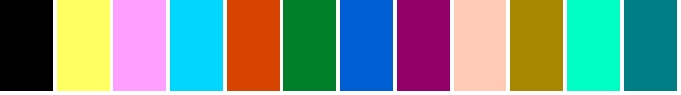

In [64]:
distinguishable_colors(12)

In [65]:
@manipulate for n in 1:80
    distinguishable_colors(n)
end

Widget{:manipulate,Any}(OrderedDict{Symbol,Any}(:n=>Widget{:slider,Int64}(OrderedDict{Symbol,Any}(:changes=>Observable{Int64}("ob_61", 0, Any[SyncCallback(Scope("knockout-component-d3d9f88b-b8b3-4d34-acd6-2931ee2fdc04", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["n"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>80,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64}(#= circular reference @-6 =#), nothing),"value"=>(Observable{Int64}("ob_60", 40, Any[SyncCallback(Scope(#= circular reference @-6 =#), SyncCallback(Scope(#= circular reference @-7 =#), ##40#42{Scope,String}(Scope(#= circular reference @-8 =#), "value"))), #g#15{##16#17{##61#63,Observable{Any}},Tuple{Observable{Int64}}}(##16#17{##61#63,Observable{Any}}(##61#63(), Observable{Any}("ob_62", RGB{FixedPointNumbers.Normed{UInt8,8}}[RGB{N0f8}(0.0,0.0,0.0), RGB{N0f8}(1.0,1.0,0.384), RGB{N0f8}(1.0,0.624,1.0), RGB{N0f8}(0.0,0.839,1.0), RGB{N0f8}(0.843,0.267,0.0), RGB{N0f8}(0.0,0.502,0.161), RGB{N0f8}(0.0,0.373,0.835), RGB{N0f8}(0.576,0.0,0.408), RGB{N0f8}(1.0,0.796,0.71), RGB{N0f8}(0.655,0.525,0.0)  …  RGB{N0f8}(0.357,0.294,0.514), RGB{N0f8}(0.0,0.58,0.812), RGB{N0f8}(0.722,0.451,0.624), RGB{N0f8}(1.0,0.51,0.412), RGB{N0f8}(1.0,0.745,0.02), RGB{N0f8}(0.761,0.0,0.188), RGB{N0f8}(0.663,0.502,0.424), RGB{N0f8}(0.584,0.337,0.0), RGB{N0f8}(0.624,0.702,0.698), RGB{N0f8}(0.471,0.584,0.0)], Any[])), (Observable{Int64}(#= circular reference @-4 =#),))]), nothing)), Set(String[]), nothing, Any["knockout"=>"/Users/alanedelman/.julia/packages/Knockout/JIqpG/src/../assets/knockout.js", "knockout_punches"=>"/Users/alanedelman/.julia/packages/Knockout/JIqpG/src/../assets/knockout_punches.js", "/Users/alanedelman/.julia/packages/InteractBase/Q4IkI/src/../assets/all.js", "/Users/alanedelman/.julia/packages/InteractBase/Q4IkI/src/../assets/style.css", "/Users/alanedelman/.julia/packages/InteractBulma/Ohu5Y/src/../assets/main.css"], Dict{Any,Any}("_promises"=>Dict{Any,Any}("importsLoaded"=>Any[JSString("function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init : function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n                var val = parseFloat(value);\n                if (!isNaN(val)) {\n                    valueAccessor()(val);\n                }\n            })\n            valueAccessor().subscribe(function(value) {\n                var str = JSON.stringify(value);\n                if ((str == \"0\") && ([\"-0\", \"-0.\"].indexOf(stringified()) >= 0))\n                     return;\n                 if ([\"null\", \"\"].indexOf(str) >= 0)\n                     return;\n                stringified(str);\n            })\n            ko.applyBindingsToNode(element, { value: stringified, valueUpdate: allBindings.get('valueUpdate')}, context);\n        }\n    };\n    var json_data = JSON.parse(\"{\\\"changes\\\":0,\\

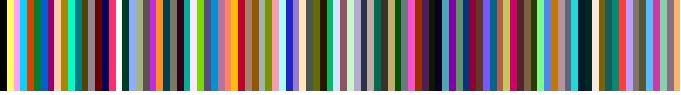

In [66]:
colors = distinguishable_colors(100)


In [67]:
# Remember this ????
A = fill(0, 10, 10)
n = size(A, 1)

@manipulate for i in 1:n-2, j in 1:n-2
    insert_block(A, i, j)
end

Widget{:manipulate,Any}(OrderedDict{Symbol,Any}(:i=>Widget{:slider,Int64}(OrderedDict{Symbol,Any}(:changes=>Observable{Int64}("ob_66", 0, Any[SyncCallback(Scope("knockout-component-d4476fbd-5b10-411d-8a5f-5a0ba5551191", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["i"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>8,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64}(#= circular reference @-6 =#), nothing),"value"=>(Observable{Int64}("ob_65", 4, Any[SyncCallback(Scope(#= circular reference @-6 =#), SyncCallback(Scope(#= circular reference @-7 =#), ##40#42{Scope,String}(Scope(#= circular reference @-8 =#), "value"))), #g#15{##16#17{##65#67,Observable{Any}},Tuple{Observable{Int64},Observable{Int64}}}(##16#17{##65#67,Observable{Any}}(##65#67(), Observable{Any}("ob_69", [0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0], Any[])), (Observable{Int64}(#= circular reference @-4 =#), Observable{Int64}("ob_67", 4, Any[SyncCallback(Scope("knockout-component-4edde297-3209-48e4-bbd8-cd3a4c725e2d", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["j"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>8,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64}("ob_68", 0, Any[SyncCallback(Scope(#= circular reference @-6 =#), SyncCallback(Scope(#= circular reference @-7 =#), ##40#42{Scope,String}(Scope(#= circular reference @-8 =#), "changes")))]), nothing),"value"=>(Observable{Int64}(#= circular reference @-6 =#), nothing)), Set(String[]), nothing, Any["knockout"=>"/Users/alanedelman/.julia/packages/Knockout/JIqpG/src/../assets/knockout.js", "knockout_punches"=>"/Users/alanedelman/.julia/packages/Knockout/JIqpG/src/../assets/knockout_punches.js", "/Users/alanedelman/.julia/packages/InteractBase/Q4IkI/src/../assets/all.js", "/Users/alanedelman/.julia/packages/InteractBase/Q4IkI/src/../assets/style.css", "/Users/alanedelman/.julia/packages/InteractBulma/Ohu5Y/src/../assets/main.css"], Dict{Any,Any}("_promises"=>Dict{Any,Any}("importsLoaded"=>Any[JSString("function (ko, koPunches) {\n    ko.

What happens if we use colors instead?

In [69]:
A = fill(colors[1], 10, 10)
n = size(A, 1)

@manipulate for i in 1:n-2, j in 1:n-2
    insert_block(A, i, j, colors[3])
end

Widget{:manipulate,Any}(OrderedDict{Symbol,Any}(:i=>Widget{:slider,Int64}(OrderedDict{Symbol,Any}(:changes=>Observable{Int64}("ob_80", 0, Any[SyncCallback(Scope("knockout-component-4aff2e02-bd48-4871-8e90-a846be6239d3", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["i"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>8,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64}(#= circular reference @-6 =#), nothing),"value"=>(Observable{Int64}("ob_79", 4, Any[SyncCallback(Scope(#= circular reference @-6 =#), SyncCallback(Scope(#= circular reference @-7 =#), ##40#42{Scope,String}(Scope(#= circular reference @-8 =#), "value"))), #g#15{##16#17{##73#75,Observable{Any}},Tuple{Observable{Int64},Observable{Int64}}}(##16#17{##73#75,Observable{Any}}(##73#75(), Observable{Any}("ob_83", RGB{FixedPointNumbers.Normed{UInt8,8}}[RGB{N0f8}(0.0,0.0,0.0) RGB{N0f8}(0.0,0.0,0.0) … RGB{N0f8}(0.0,0.0,0.0) RGB{N0f8}(0.0,0.0,0.0); RGB{N0f8}(0.0,0.0,0.0) RGB{N0f8}(0.0,0.0,0.0) … RGB{N0f8}(0.0,0.0,0.0) RGB{N0f8}(0.0,0.0,0.0); … ; RGB{N0f8}(0.0,0.0,0.0) RGB{N0f8}(0.0,0.0,0.0) … RGB{N0f8}(0.0,0.0,0.0) RGB{N0f8}(0.0,0.0,0.0); RGB{N0f8}(0.0,0.0,0.0) RGB{N0f8}(0.0,0.0,0.0) … RGB{N0f8}(0.0,0.0,0.0) RGB{N0f8}(0.0,0.0,0.0)], Any[])), (Observable{Int64}(#= circular reference @-4 =#), Observable{Int64}("ob_81", 4, Any[SyncCallback(Scope("knockout-component-5f165540-676d-42c9-a09c-3a0181a9f710", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["j"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>8,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64}("ob_82", 0, Any[SyncCallback(Scope(#= circular reference @-6 =#), SyncCallback(Scope(#= circular reference @-7 =#), ##40#42{Scope,String}(Scope(#= circular reference @-8 =#), "changes")))]), nothing),"value"=>(Observable{Int64}(#= circular reference @-6 =#), nothing)), Set(String[]), nothing, Any["knockout"=>"/Users/alanedelman/.julia/packages/Knockout/JIqpG/src/../assets/knockout.js", "knockout_punches"=>"/Users/alanedelman/.julia/packages/Knockout/JIqpG/src/../ass

In [119]:
# Exercise: Create Tetris Pieces, have them fall from the top

## Images

In [121]:
Pkg.add("Images")

 Resolving package versions...
 Installed OffsetArrays ────────────── v0.8.1
 Installed SIUnits ─────────────────── v0.1.0
 Installed Graphics ────────────────── v0.3.0
 Installed ImageShow ───────────────── v0.1.1
 Installed ImageAxes ───────────────── v0.5.0
 Installed FFTViews ────────────────── v0.2.0
 Installed Images ──────────────────── v0.16.0
 Installed ImageDistances ──────────── v0.1.1
 Installed IntervalSets ────────────── v0.3.0
 Installed SpecialFunctions ────────── v0.7.0
 Installed ComputationalResources ──── v0.3.0
 Installed TexExtensions ───────────── v0.1.0
 Installed IndirectArrays ──────────── v0.5.0
 Installed Rotations ───────────────── v0.8.0
 Installed ColorVectorSpace ────────── v0.6.2
 Installed TiledIteration ──────────── v0.2.3
 Installed ImageMetadata ───────────── v0.5.0
 Installed MappedArrays ────────────── v0.2.1
 Installed CoordinateTransformations ─ v0.5.0
 Installed ShowItLikeYouBuildIt ────── v0.2.0
 Installed FileIO ──────────────────── v1.0.1
 I

In [122]:
Pkg.add("FileIO")

 Resolving package versions...
  Updating `~/.julia/environments/v1.0/Project.toml`
  [5789e2e9] + FileIO v1.0.1
  Updating `~/.julia/environments/v1.0/Manifest.toml`
 [no changes]


In [123]:
Pkg.add("ImageMagick")

 Resolving package versions...
 Installed ImageMagick ─ v0.7.1
  Updating `~/.julia/environments/v1.0/Project.toml`
  [6218d12a] + ImageMagick v0.7.1
  Updating `~/.julia/environments/v1.0/Manifest.toml`
  [6218d12a] + ImageMagick v0.7.1
  Building ImageMagick → `~/.julia/packages/ImageMagick/d5KBL/deps/build.log`


Widget{:manipulate,Any}(OrderedDict{Symbol,Any}(:i=>Widget{:slider,Int64}(OrderedDict{Symbol,Any}(:changes=>Observable{Int64}("ob_87", 0, Any[SyncCallback(Scope("knockout-component-dc8387b5-1d8d-4380-b691-b8712dbf8122", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["i"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>8,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64}(#= circular reference @-6 =#), nothing),"value"=>(Observable{Int64}("ob_86", 4, Any[SyncCallback(Scope(#= circular reference @-6 =#), SyncCallback(Scope(#= circular reference @-7 =#), ##40#42{Scope,String}(Scope(#= circular reference @-8 =#), "value"))), #g#15{##16#17{##77#79,Observable{Any}},Tuple{Observable{Int64},Observable{Int64}}}(##16#17{##77#79,Observable{Any}}(##77#79(), Observable{Any}("ob_90", Array{RGB{Normed{UInt8,8}},2}[[RGB{N0f8}(0.376,0.412,0.478) RGB{N0f8}(0.337,0.365,0.427) … RGB{N0f8}(0.427,0.439,0.506) RGB{N0f8}(0.455,0.467,0.541); RGB{N0f8}(0.357,0.38,0.435) RGB{N0f8}(0.314,0.337,0.392) … RGB{N0f8}(0.427,0.455,0.518) RGB{N0f8}(0.447,0.482,0.549); … ; RGB{N0f8}(0.424,0.459,0.573) RGB{N0f8}(0.424,0.459,0.573) … RGB{N0f8}(0.42,0.463,0.533) RGB{N0f8}(0.431,0.475,0.545); RGB{N0f8}(0.416,0.459,0.584) RGB{N0f8}(0.4,0.443,0.569) … RGB{N0f8}(0.475,0.514,0.612) RGB{N0f8}(0.482,0.522,0.62)] [RGB{N0f8}(0.376,0.412,0.478) RGB{N0f8}(0.337,0.365,0.427) … RGB{N0f8}(0.427,0.439,0.506) RGB{N0f8}(0.455,0.467,0.541); RGB{N0f8}(0.357,0.38,0.435) RGB{N0f8}(0.314,0.337,0.392) … RGB{N0f8}(0.427,0.455,0.518) RGB{N0f8}(0.447,0.482,0.549); … ; RGB{N0f8}(0.424,0.459,0.573) RGB{N0f8}(0.424,0.459,0.573) … RGB{N0f8}(0.42,0.463,0.533) RGB{N0f8}(0.431,0.475,0.545); RGB{N0f8}(0.416,0.459,0.584) RGB{N0f8}(0.4,0.443,0.569) … RGB{N0f8}(0.475,0.514,0.612) RGB{N0f8}(0.482,0.522,0.62)] … [RGB{N0f8}(0.376,0.412,0.478) RGB{N0f8}(0.337,0.365,0.427) … RGB{N0f8}(0.427,0.439,0.506) RGB{N0f8}(0.455,0.467,0.541); RGB{N0f8}(0.357,0.38,0.435) RGB{N0f8}(0.314,0.337,0.392) … RGB{N0f8}(0.427,0.455,0.518) RGB{N0f8}(0.447,0.482,0.549); … ; RGB{N0f8}(0.424,0.459,0.573) RGB{N0f8}(0.424,0.459,0.573) … RGB{N0f8}(0.42,0.463,0.533) RGB{N0f8}(0.431,0.475,0.545); RGB{N0f8}(0.416,0.459,0.584) RGB{N0f8}(0.4,0.443,0.569) … RGB{N0f8}(0.475,0.514,0.612) RGB{N0f8}(0.482,0.522,0.62)] [RGB{N0f8}(0.376,0.412,0.478) RGB{N0f8}(0.337,0.365,0.427) … RGB{N0f8}(0.427,0.439,0.506) RGB{N0f8}(0.455,0.467,0.541); RGB{N0f8}(0.357,0.38,0.435) RGB{N0f8}(0.314,0.337,0.392) … RGB{N0f8}(0.427,0.455,0.518) RGB{N0f8}(0.447,0.482,0.549); … ; RGB{N0f8}(0.424,0.459,0.573) RGB{N0f8}(0.424,0.459,0.573) … RGB{N0f8}(0.42,0.463,0.533) RGB{N0f8}(0.431,0.475,0.545); RGB{N0f8}(0.416,0.459,0.584) RGB{N0f8}(0.4,0.443,0.569) … RGB{N0f8}(0.475,0.514,0.612) RGB{N0f8}(0.482,0.522,0.62)]; [RGB{N0f8}(0.376,0.412,0.478) RGB{N0f8}(0.337,0.365,0.427) … RGB{N0f8}(0.427,0.439,0.506) RGB{N0f8}(0.455,0.467,0.541); RGB{N0f8}(0.357,0.38,0.435) RGB{N0f8}(0.314,0.337,0.392) … RGB{N0f8}(0.427,0.455,0.518) RGB{N0f8}(0.447,0.482,0.549); … ; RGB{N0f8}(0.424,0.459,0.573) RGB{N0f8}(0
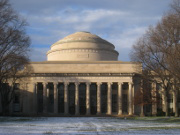
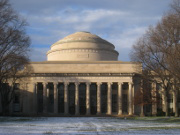
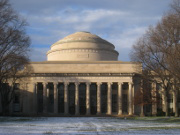
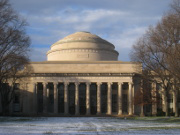
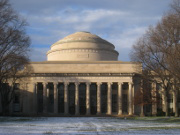
...
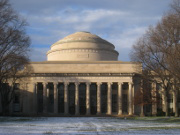
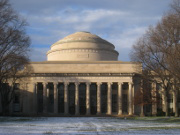
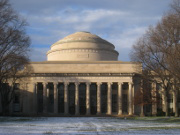
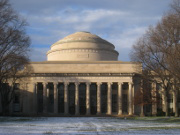
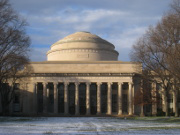

In [70]:
using Images, FileIO, Interact

mit = load("mit.jpg")
julia = load("julia.png")

A = fill(mit, 10, 10)
n = size(A, 1)

@manipulate for i in 1:n-2, j in 1:n-2
    insert_block(A, i, j, julia)
end